___Data-based insights to fight against Boston criminality___ 🆘🆘🆘


🚩 __Scope of analysis__ :
- Boston central districts
- 226k incidents from mid-2015 to end of 2018

🎯 __Analysis objectives__ :
- _How to help Police Department to fight against Boston criminality?_

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
from IPython.display import Javascript
from plotly.offline import get_plotlyjs
Javascript(get_plotlyjs())

<IPython.core.display.Javascript object>

### Get data ###

In [3]:
# Load the dataset
from data import load_data_viz_data

data = load_data_viz_data()
data[['LAT','LONG']] = data[['LAT','LONG']].astype('float64')

print("Shape of the DataFrame:", data.shape)

data.head()

Shape of the DataFrame: (237221, 9)


,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,SHOOTING,OCCURRED_ON_DATE,LAT,LONG,NAME,LAT_POLICE_STATION,LONG_POLICE_STATION
0,I192068249,Other,0,2015-08-28 10:20:00,42.330119,-71.084251,Roxbury,42.328894,-71.085359
1,I182074094,Violence and harassment,0,2015-09-14 09:31:00,42.315142,-71.067047,Roxbury,42.328894,-71.085359
2,I182054888,Violence and harassment,0,2015-07-12 15:37:00,42.312243,-71.075499,Roxbury,42.328894,-71.085359
3,I182054888,Other,0,2015-07-12 15:37:00,42.312243,-71.075499,Roxbury,42.328894,-71.085359
4,I182054888,Other,0,2015-07-12 15:37:00,42.312243,-71.075499,Roxbury,42.328894,-71.085359


In [4]:
data = data.drop_duplicates()

In [59]:
data.sort_values('OCCURRED_ON_DATE', ascending = True)

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,SHOOTING,OCCURRED_ON_DATE,LAT,LONG,NAME,LAT_POLICE_STATION,LONG_POLICE_STATION,DISTANCE_POLICE
185670,I152051083,Police investigation procedure,0,2015-06-15 00:00:00,42.377023,-71.032247,East Boston,42.371200,-71.038700,0.836802
74932,I152067251,Fraud and law violations,0,2015-06-15 00:00:00,42.360205,-71.056208,Downtown,42.361800,-71.060300,0.380131
43282,I152059178,Other,0,2015-06-15 00:00:00,42.293606,-71.071887,Dorchester,42.298068,-71.059141,1.159793
38887,I172040657,Violence and harassment,0,2015-06-15 00:00:00,42.291093,-71.065945,Dorchester,42.298068,-71.059141,0.956470
145652,I152054279,Fraud and law violations,0,2015-06-15 00:00:00,42.300217,-71.080979,Mattapan,42.284800,-71.091600,1.924025
...,...,...,...,...,...,...,...,...,...,...
180232,I182105271,Violence and harassment,0,2018-12-31 23:15:00,42.349007,-71.138601,Brighton,42.349300,-71.150600,0.986596
214825,I192000001,Police investigation procedure,0,2018-12-31 23:20:00,42.353636,-71.047396,South Boston,42.341200,-71.054900,1.514063
200583,I192000256,Larceny and vandalism,0,2018-12-31 23:30:00,42.294217,-71.119853,West Roxbury,42.286800,-71.148400,2.488800
133540,I192000002,Police investigation procedure,0,2018-12-31 23:41:00,42.347102,-71.088417,South End,42.339629,-71.069161,1.787520


In [5]:
# Haversine distance function
from math import radians, sin, cos, asin, sqrt

def haversine_distance(x):
    """
    Compute distance (km) between two pairs of (lat, lng) coordinates
    See - (https://en.wikipedia.org/wiki/Haversine_formula)
    """
    
    lon1 = x['LONG']
    lat1 = x['LAT']
    lon2 = x['LONG_POLICE_STATION']
    lat2 = x['LAT_POLICE_STATION']
    
    
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    
    return 2 * 6371 * asin(sqrt(a))

In [6]:
data['DISTANCE_POLICE'] = data.apply(lambda x : haversine_distance(x), axis=1)

In [7]:
data.head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,SHOOTING,OCCURRED_ON_DATE,LAT,LONG,NAME,LAT_POLICE_STATION,LONG_POLICE_STATION,DISTANCE_POLICE
0,I192068249,Other,0,2015-08-28 10:20:00,42.330119,-71.084251,Roxbury,42.328894,-71.085359,0.163832
1,I182074094,Violence and harassment,0,2015-09-14 09:31:00,42.315142,-71.067047,Roxbury,42.328894,-71.085359,2.145919
2,I182054888,Violence and harassment,0,2015-07-12 15:37:00,42.312243,-71.075499,Roxbury,42.328894,-71.085359,2.021175
3,I182054888,Other,0,2015-07-12 15:37:00,42.312243,-71.075499,Roxbury,42.328894,-71.085359,2.021175
5,I172075854,Fraud and law violations,0,2015-09-02 09:00:00,42.314013,-71.086353,Roxbury,42.328894,-71.085359,1.656718


In [8]:
distance_df = data.groupby('NAME')[['DISTANCE_POLICE','INCIDENT_NUMBER']].agg({'INCIDENT_NUMBER':'count','DISTANCE_POLICE':'mean'})

In [10]:
distance_df = distance_df.sort_values('INCIDENT_NUMBER', ascending=False)
distance_df

,INCIDENT_NUMBER,DISTANCE_POLICE
NAME,,
Roxbury,36846,3.071217
Dorchester,31153,2.996930
South End,29589,1.897830
Mattapan,27242,1.931604
Downtown,24781,6.659388
South Boston,15918,30.641979
Brighton,13268,3.865875
Jamaica Plain,12171,2.655415
Hyde Park,12056,2.425048


In [15]:
fig = px.bar(distance_df, x=distance_df.index, y='INCIDENT_NUMBER', color='DISTANCE_POLICE', width=800, height=400, title='Is the police station far from crimes in districs where there is a massive criminality ?')
fig.show()

print('New police station should be set up in South Boston, which accounts for 7% of total crimes (6th worst district) and with an average of 30km of distance from crimes. Could be done in Downtonw districts as well')

New police station should be set up in South Boston, which accounts for 7% of total crimes (6th worst district) and with an average of 30km of distance from crimes. Could be done in Downtonw districts as well


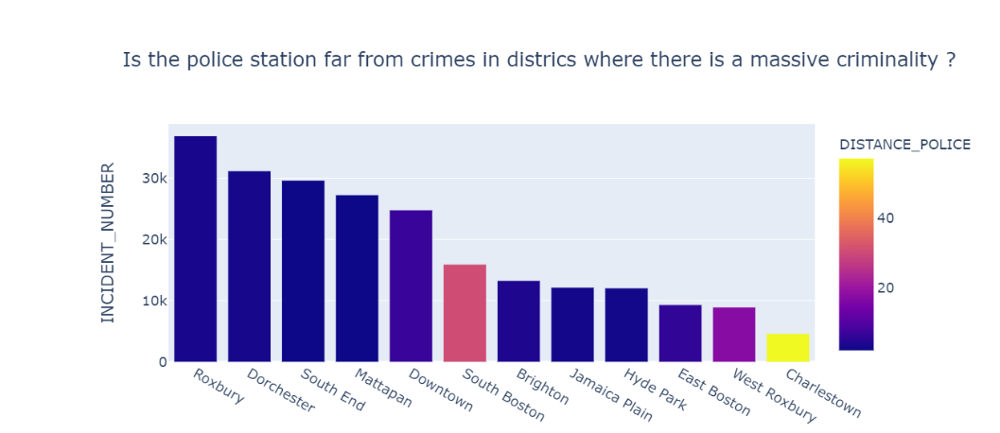

In [26]:
crimes_types = data.groupby('OFFENSE_CODE_GROUP')[['INCIDENT_NUMBER']].count().sort_values('INCIDENT_NUMBER', ascending=False)

In [27]:
crimes_types

,INCIDENT_NUMBER
OFFENSE_CODE_GROUP,
Larceny and vandalism,72967
Police investigation procedure,49564
Violence and harassment,28446
Fraud and law violations,25512
Other,18831
Disputes,15405
Drugs and disorderly conduct,15159


Larceny and vandalism is the most represented incidents in almost all districts. It is mostly driven by the South End district, where more police monitoring should be done


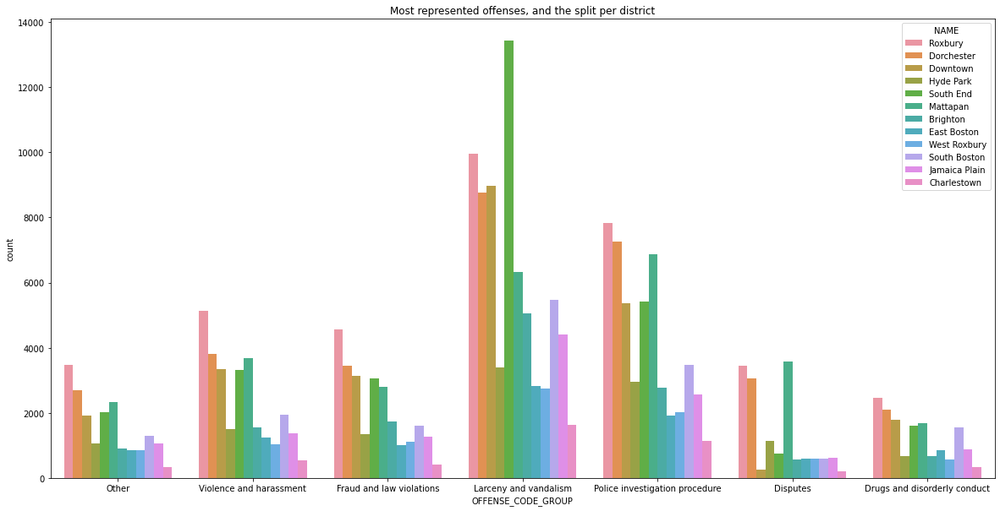

In [41]:
plt.figure(figsize=(20,10))
sns.countplot(data = data, x = "OFFENSE_CODE_GROUP", hue='NAME').set(title='Most represented offenses, and the split per district')
print('Larceny and vandalism is the most represented incidents in almost all districts. It is mostly driven by the South End district, where more police monitoring should be done')

In [ ]:
fig = px.scatter_geo(data, lat="geolocation_lat", lon="geolocation_lng", 
                    size="profits", title="Profits per State / City",
                    scope='south america',
                    hover_data=[city.index],
                    color="geolocation_state")
fig.show()

In [50]:
districts = data.groupby('NAME')[['INCIDENT_NUMBER']].count()

In [51]:
districts

,INCIDENT_NUMBER
NAME,
Brighton,13268
Charlestown,4596
Dorchester,31153
Downtown,24781
East Boston,9321
Hyde Park,12056
Jamaica Plain,12171
Mattapan,27242
Roxbury,36846


In [57]:
police_station = data[['NAME','LAT_POLICE_STATION', 'LONG_POLICE_STATION']]

In [ ]:
police_st = data[["NAME", "LAT_POLICE_STATION", "LONG_POLICE_STATION"]].copy().drop_duplicates().reset_index(drop=True)
incidents_df1 = geo_df[["NAME", "OFFENSE_CODE_GROUP", "INCIDENT_NUMBER"]].copy()
incidents_df1 = incidents_df1.groupby(["NAME", "OFFENSE_CODE_GROUP"]).\
    count().sort_values(by=["NAME", "INCIDENT_NUMBER"], ascending=[True, False]).reset_index()
    
incidents_df1.merge(police_st, on="NAME")

In [61]:
fig = px.scatter_mapbox(data, lat="LAT", lon="LONG", color="OFFENSE_CODE_GROUP", mapbox_style="open-street-map", title='Repartition of crimes per type of offences, on Boston map')
fig.show()

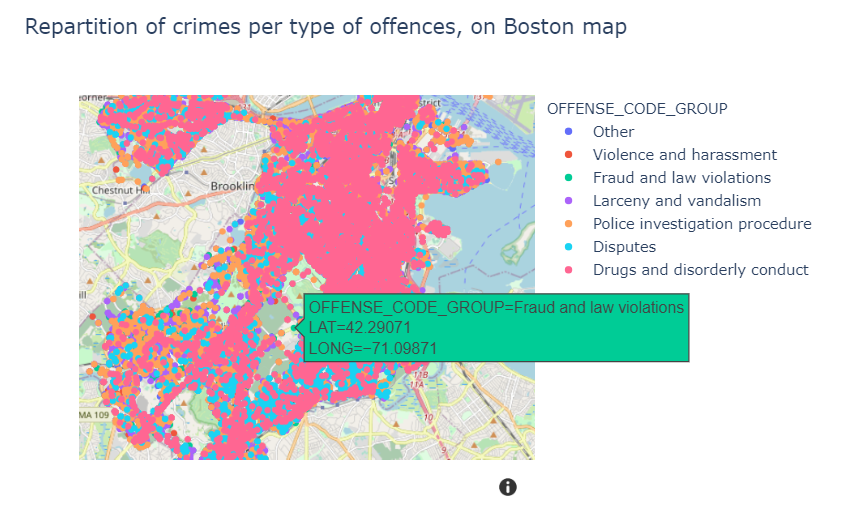

⚠⚠⚠ ___It seems that Plotly is very very long to load on a html file. Please do not hesitate to open "Presentation.ipynb" to see my 2 plotly graphs (if it takes to much time to load). Thanks !___ ⚠⚠⚠